In [3]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, f1_score
from sklearn.feature_selection import RFE
import pandas as pd

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from warnings import filterwarnings
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score, f1_score
from sklearn.model_selection import train_test_split,StratifiedKFold, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier,VotingClassifier
from sklearn.preprocessing import minmax_scale, MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing
import joblib
#from xgboost import XGBClassifier
#from catboost import CatBoostClassifier
import librosa
import librosa.display
from IPython.display import Audio
import tensorflow as tf
#import tensorflow.keras.layers as L
#from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
#import tensorflow_addons as tfa
import time
import os
import random
from sklearn.cluster import KMeans

In [11]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
import os


In [ ]:
import os
import numpy as np
import scipy
from scipy.io import wavfile
import scipy.fftpack as fft
from scipy.signal import get_window
import IPython.display as ipd
import matplotlib.pyplot as plt

%matplotlib inline

#Data loading

In [ ]:
#Load Data
GENERAL_PATH='G:\\SEM 7 code\\Speech Recognition\\Data'
df = pd.read_csv(f'{GENERAL_PATH}/features_30_sec.csv')

#Exploring the dataset

In [ ]:
df['label'].value_counts()

blues        100
classical    100
country      100
disco        100
hiphop       100
jazz         100
metal        100
pop          100
reggae       100
rock         100
Name: label, dtype: int64

In [ ]:
df.isna().sum()

In [ ]:
genres=df['label'].unique()
print(genres)

['blues' 'classical' 'country' 'disco' 'hiphop' 'jazz' 'metal' 'pop'
 'reggae' 'rock']


In [ ]:
#Dictionary with file names for each genre
visualize_audio_path = {}
for genre in genres:
    audio_files = [file for file in os.listdir(f'{GENERAL_PATH}/genres_original/{genre}') if file.endswith('.wav')]
    visualize_audio_path[genre] = audio_files

print(visualize_audio_path)

{'blues': ['blues.00000.wav', 'blues.00001.wav', 'blues.00002.wav', 'blues.00003.wav', 'blues.00004.wav', 'blues.00005.wav', 'blues.00006.wav', 'blues.00007.wav', 'blues.00008.wav', 'blues.00009.wav', 'blues.00010.wav', 'blues.00011.wav', 'blues.00012.wav', 'blues.00013.wav', 'blues.00014.wav', 'blues.00015.wav', 'blues.00016.wav', 'blues.00017.wav', 'blues.00018.wav', 'blues.00019.wav', 'blues.00020.wav', 'blues.00021.wav', 'blues.00022.wav', 'blues.00023.wav', 'blues.00024.wav', 'blues.00025.wav', 'blues.00026.wav', 'blues.00027.wav', 'blues.00028.wav', 'blues.00029.wav', 'blues.00030.wav', 'blues.00031.wav', 'blues.00032.wav', 'blues.00033.wav', 'blues.00034.wav', 'blues.00035.wav', 'blues.00036.wav', 'blues.00037.wav', 'blues.00038.wav', 'blues.00039.wav', 'blues.00040.wav', 'blues.00041.wav', 'blues.00042.wav', 'blues.00043.wav', 'blues.00044.wav', 'blues.00045.wav', 'blues.00046.wav', 'blues.00047.wav', 'blues.00048.wav', 'blues.00049.wav', 'blues.00050.wav', 'blues.00051.wav', '

In [ ]:
# Random selection of one file from each genre
random_audio_selection = {}
for genre, files in visualize_audio_path.items():
    random_audio = random.choice(files)
    random_audio_selection[genre] = random_audio

random_audio_selection

{'blues': 'blues.00040.wav',
 'classical': 'classical.00023.wav',
 'country': 'country.00002.wav',
 'disco': 'disco.00008.wav',
 'hiphop': 'hiphop.00090.wav',
 'jazz': 'jazz.00009.wav',
 'metal': 'metal.00092.wav',
 'pop': 'pop.00037.wav',
 'reggae': 'reggae.00057.wav',
 'rock': 'rock.00026.wav'}

In [ ]:
#audio
audios={}
sample_rates={}
for audio in random_audio_selection.keys():
    audio_path=f'{GENERAL_PATH}/genres_original/{audio}/{random_audio_selection[audio]}'
    data,sr=librosa.load(audio_path,sr=45600)
    audios[audio]=data
    sample_rates[f'{audio}:sr']=sr

In [ ]:
len(data)

1368608

In [ ]:
print('Blues Audio Sample\n')
Audio(audios['blues'],rate=sample_rates['blues:sr'])

Blues Audio Sample



In [ ]:
print('Classical Audio Sample\n')
Audio(audios['classical'],rate=sample_rates['classical:sr'])

Classical Audio Sample



In [ ]:
print('Country Audio Sample\n')
Audio(audios['country'],rate=sample_rates['country:sr'])

Country Audio Sample



In [ ]:
print('Disco Audio Sample\n')
Audio(audios['disco'],rate=sample_rates['disco:sr'])

Disco Audio Sample



#Audio Preprocessing

> Feature Extraction

C:\Users\PC\AppData\Local\Temp\ipykernel_19588\1394191411.py:5: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  librosa.display.specshow(stft,sr=sample_rates[audio[1]],x_axis='time',y_axis='hz')


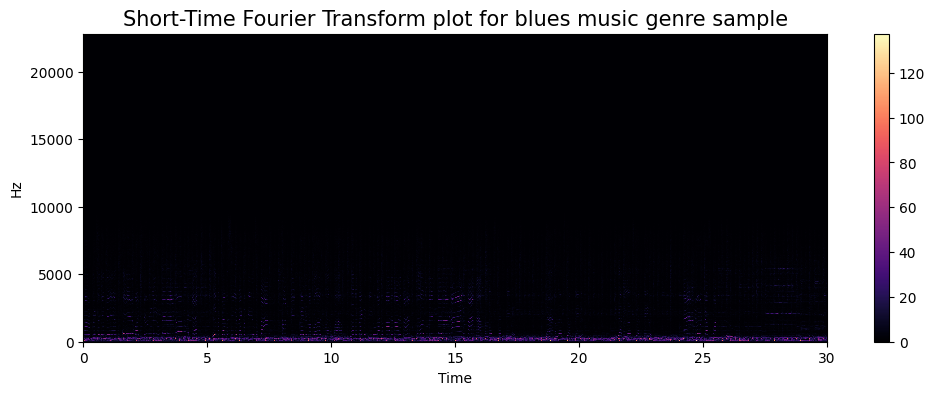

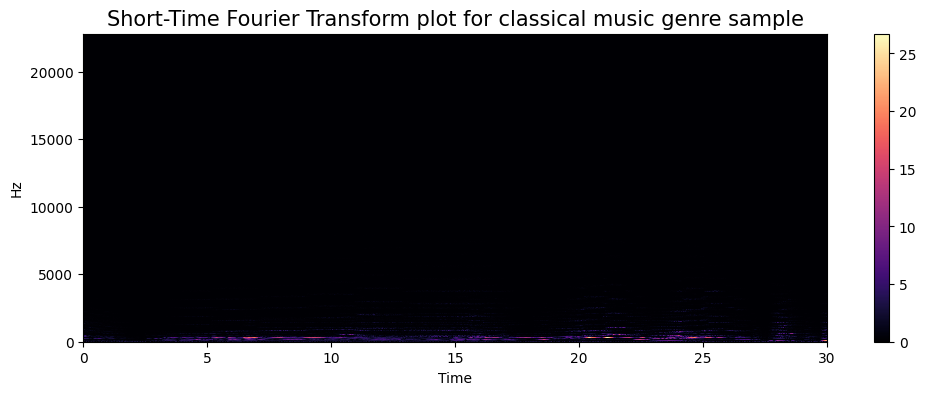

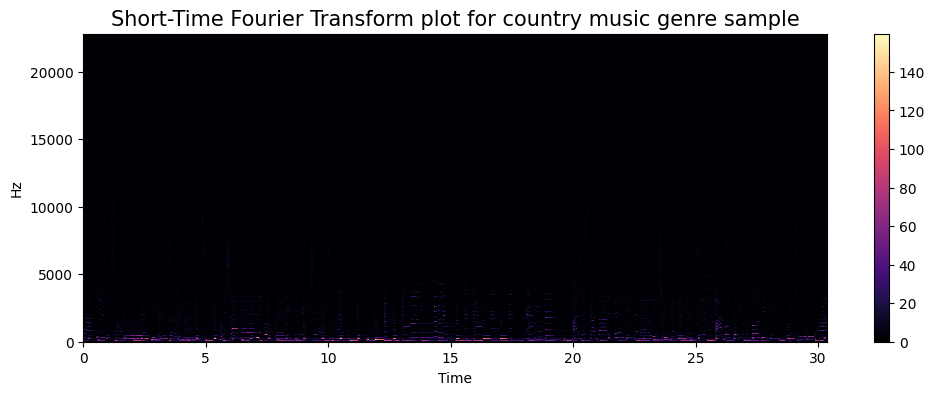

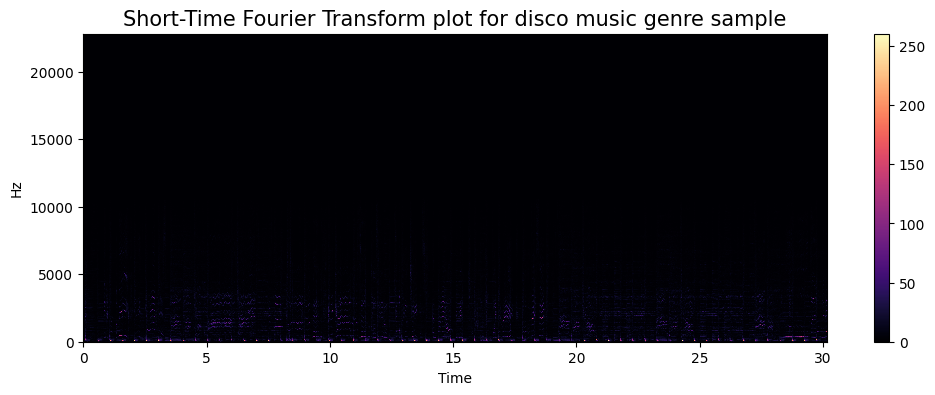

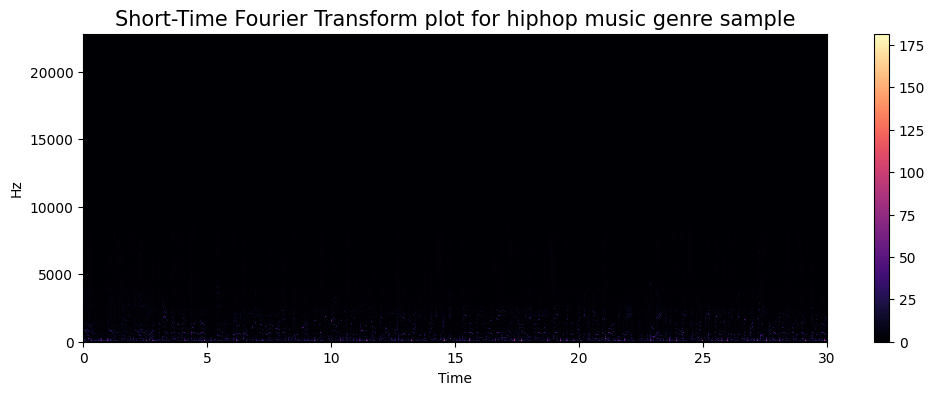

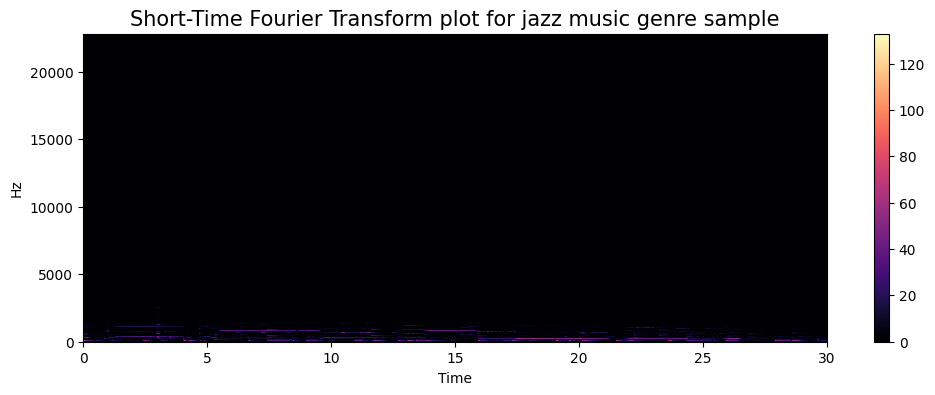

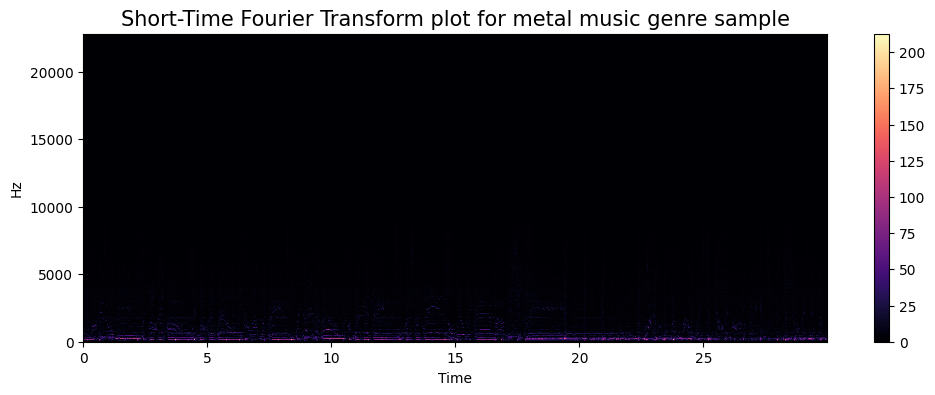

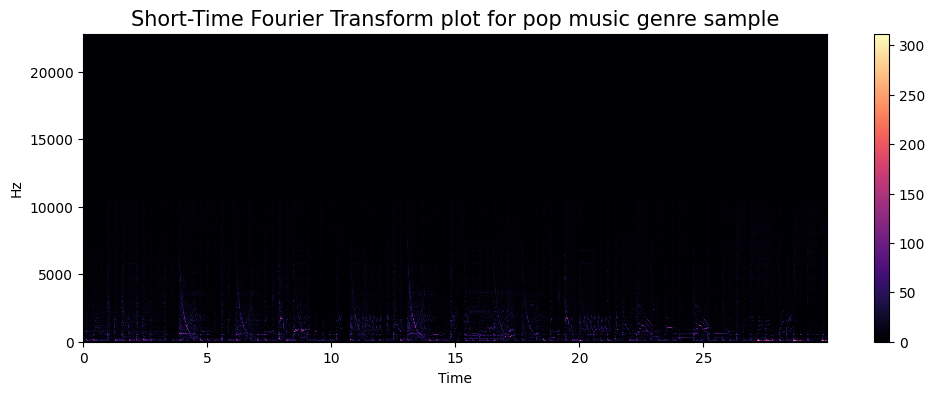

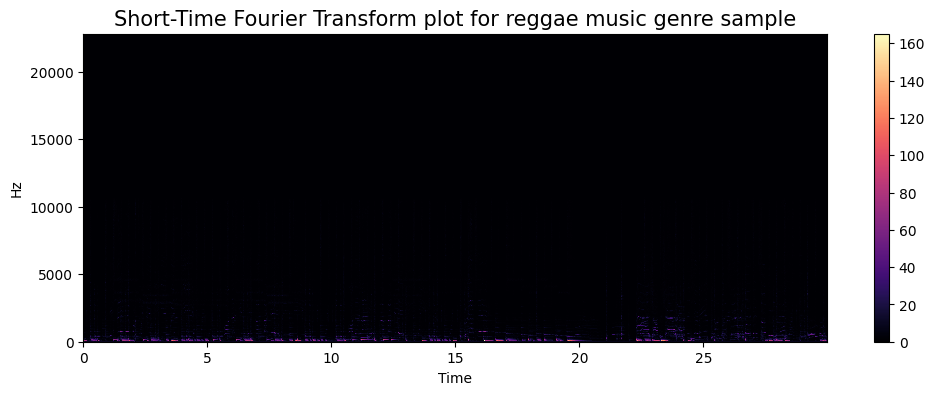

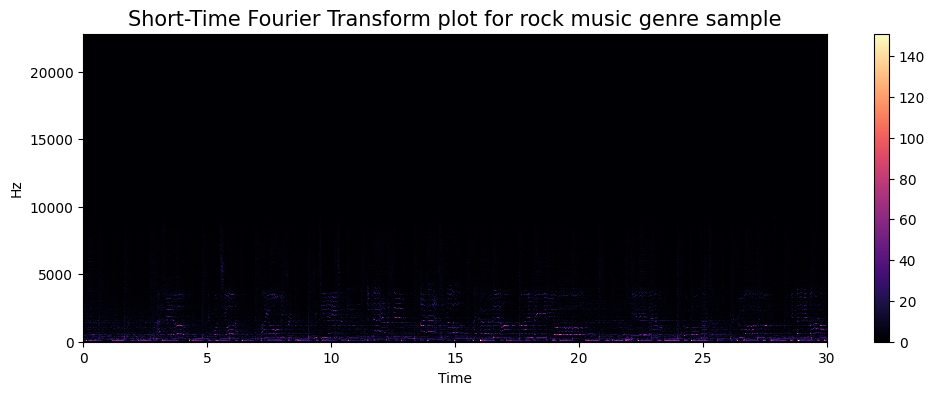

In [ ]:
for audio in zip(audios.keys(),sample_rates.keys()):
    stft=librosa.stft(audios[audio[0]])
    plt.figure(figsize=(12,4))
    plt.title(f'Short-Time Fourier Transform plot for {audio[0]} music genre sample',size=15)
    librosa.display.specshow(stft,sr=sample_rates[audio[1]],x_axis='time',y_axis='hz')
    plt.colorbar()

The plots illustrate how the frequency content of the audio signals varies over time. The color intensity in the plot represents the magnitude of the frequency components.

In [ ]:
df_ = df.iloc[:, 1:]
X = df_.loc[:, df_.columns != 'label']
y = df_['label']
cols = X.columns


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

n_components = 4
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X_scaled)
principal_df = pd.DataFrame(principal_components, columns=[f'pc{i}' for i in range(1, n_components + 1)])


f_df = pd.concat([principal_df, y], axis=1)


fig = px.scatter_3d(
    f_df,
    x='pc1',
    y='pc2',
    z='pc3',
    color='label',
    symbol='label',
    title='Principal Component Analysis for Genres (3D)',
    labels={'pc1': 'Principal Component 1', 'pc2': 'Principal Component 2', 'pc3': 'Principal Component 3', 'label': 'Genres'},
    width=1000,
    height=600
)
fig.update_traces(marker=dict(size=3))
fig.update_layout(title_x=0.5, font=dict(family='Arial, monospace', size=18, color='#6227D7'))


fig.show()

In [ ]:
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


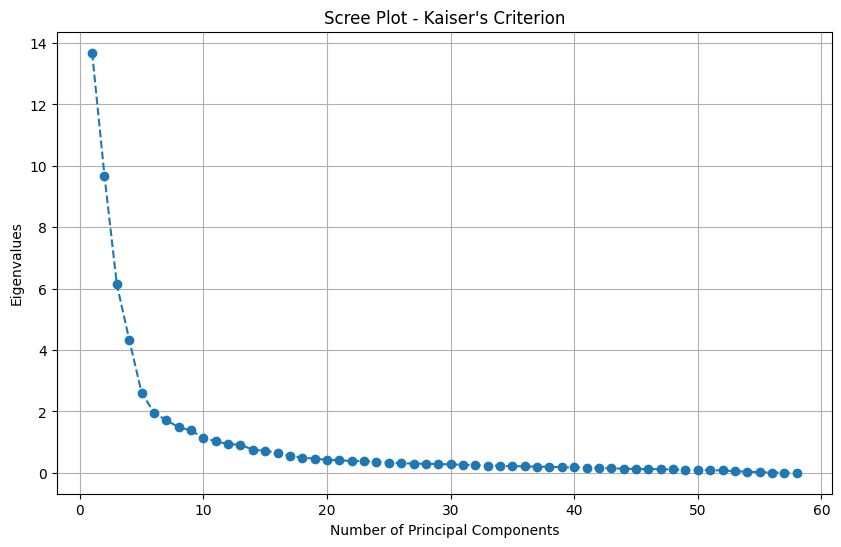

Cumulative Explained Variance Ratio:
PC1: 0.2357
PC2: 0.4022
PC3: 0.5079
PC4: 0.5826
PC5: 0.6276
PC6: 0.6614
PC7: 0.6908
PC8: 0.7164
PC9: 0.7402
PC10: 0.7598
PC11: 0.7775
PC12: 0.7936
PC13: 0.8093
PC14: 0.8222
PC15: 0.8347
PC16: 0.8458
PC17: 0.8553
PC18: 0.8639
PC19: 0.8718
PC20: 0.8791
PC21: 0.8861
PC22: 0.8927
PC23: 0.8992
PC24: 0.9054
PC25: 0.9111
PC26: 0.9165
PC27: 0.9216
PC28: 0.9267
PC29: 0.9316
PC30: 0.9364
PC31: 0.9409
PC32: 0.9451
PC33: 0.9492
PC34: 0.9531
PC35: 0.9568
PC36: 0.9604
PC37: 0.9638
PC38: 0.9672
PC39: 0.9703
PC40: 0.9733
PC41: 0.9762
PC42: 0.9789
PC43: 0.9814
PC44: 0.9837
PC45: 0.9859
PC46: 0.9879
PC47: 0.9900
PC48: 0.9918
PC49: 0.9935
PC50: 0.9950
PC51: 0.9965
PC52: 0.9978
PC53: 0.9987
PC54: 0.9993
PC55: 0.9997
PC56: 0.9999
PC57: 1.0000
PC58: 1.0000


In [ ]:
df_ = df.iloc[:, 1:]
X = df_.loc[:, df_.columns != 'label']
y = df_['label']
cols = X.columns

# StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA
pca = PCA()
pca.fit(X_scaled)


eigenvalues = pca.explained_variance_

# Eigenvalue scatterplot graph
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(eigenvalues) + 1), eigenvalues, marker='o', linestyle='--')
plt.title("Scree Plot - Kaiser's Criterion")
plt.xlabel("Number of Principal Components")
plt.ylabel("Eigenvalues")
plt.grid(True)
plt.show()

# Calculation of the cumulative explained variance
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Display of cumulative variance explained
print("Cumulative Explained Variance Ratio:")
for i, ratio in enumerate(cumulative_variance_ratio, start=1):
    print(f"PC{i}: {ratio:.4f}")

#Model Building and training

Model building will happen using 4 models, each will be trained and tested and all accuracies will be comapred.

>Random Forest Classifier

>KNN

>XGBoost

>SVM

<h3>Preprocessing The dataset

In [4]:
data = pd.read_csv('/content/drive/MyDrive/DataSpeech/features_3_sec.csv')
data.head()


,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [5]:
"""#this code preprocesses the dataframe data by selecting a subset of columns, extracting the target variable ('label'), scaling the features using Min-Max scaling,
and creating a new dataframe with the scaled features. This is a common preprocessing step in machine learning workflows to ensure that all features are on a similar scale."""

df = data.iloc[0:, 2:] # line selects all rows (0: means all rows) and columns starting from the third column (index 2)
#to the last column in the dataframe data and assigns the resulting dataframe to df.
y = df.label.values #Extracting the 'label' column values and assigning them to y
X = df.drop('label', axis = 1) # Extracting features by dropping the 'label' column from df
X_columns = X.columns # Extracting the column names of the features
scale = MinMaxScaler() #Scaling the features using Min-Max scaling
scaled_data = scale.fit_transform(X) ## Creating a new dataframe with the scaled features
X = pd.DataFrame(scaled_data, columns = X_columns).values

<h3>Building/preparing the models

This function builds any model and we will use it to build the SVM, XGBoost, KNN and Random forest classifier models

In [35]:
#model_build takes three parameters: model (the machine learning model to be trained),
#kf (a cross-validator such as KFold),
#and title (a title for the model being evaluated, defaulting to "Default").
#kf represents an instance of the KFold class,
#kf helps in increasing performance
def model_build(model, kf, title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X): #iterates over the training and testing indices generated by the KFold cross-validator (kf.split(X)).
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    # Let's see the confusion matrix of the last split for a little insight
    con_mat = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, cmap="Blues", annot=True,fmt="d",
                xticklabels = ["blues", "classical", "country", "disco",
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
                yticklabels=["blues", "classical", "country", "disco", "hiphop",
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()

In [7]:
split = KFold(n_splits=5, shuffle=True)

In [9]:
import numpy as np

#Random Forest Classifier





This is the Random forest classifier and it's confusion matrix

Accuracy score of Random Forest Classifier is: 0.81


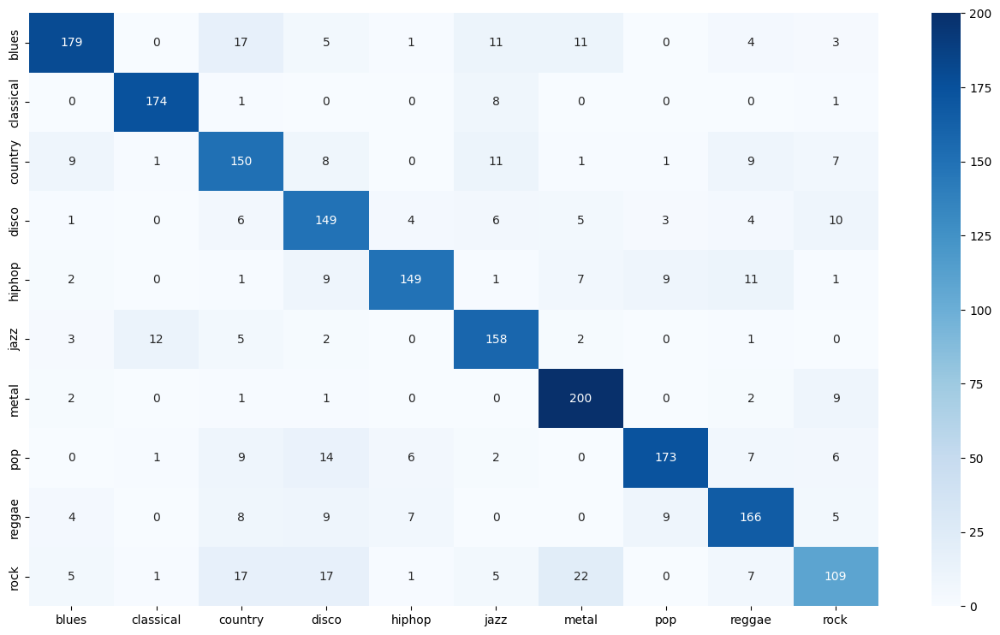

In [36]:
# Random Forest Classifer
rfc = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=10)
model_build(rfc, split, 'Random Forest Classifier')

**As we can see above, the random forest classifier got an accuracy of 0.81**

#KNN model

Accuracy score of K Nearest Neighbor is: 0.87


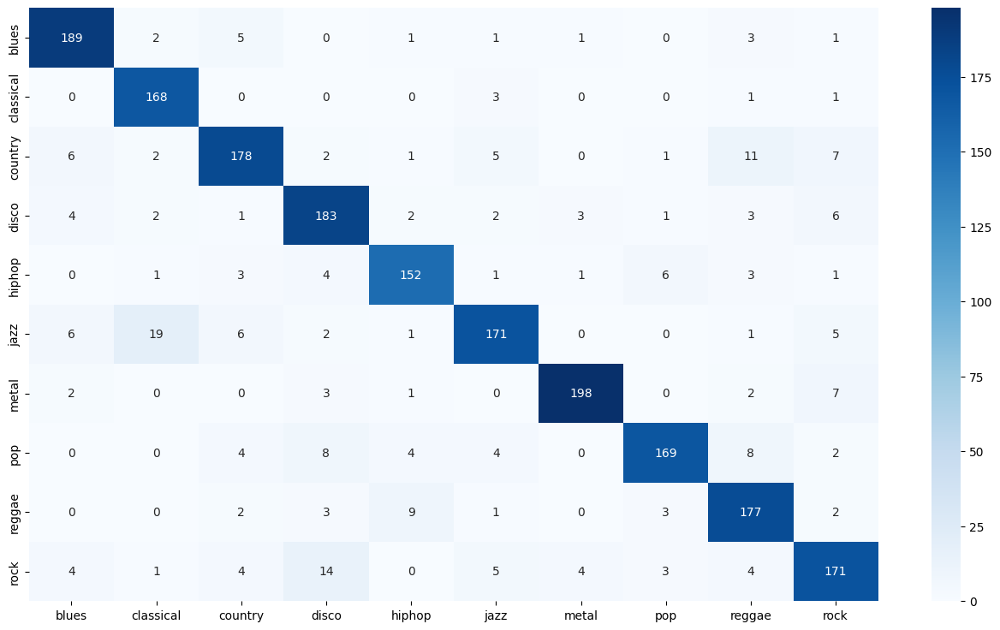

In [48]:
# K Nearest Neighbor

knn = KNeighborsClassifier(n_neighbors=10)
model_build(knn, split, 'K Nearest Neighbor')

the KNN model got an accuracy of: 0.87

#Support Vector Machine

Accuracy score of Support Vector Machine is: 0.76


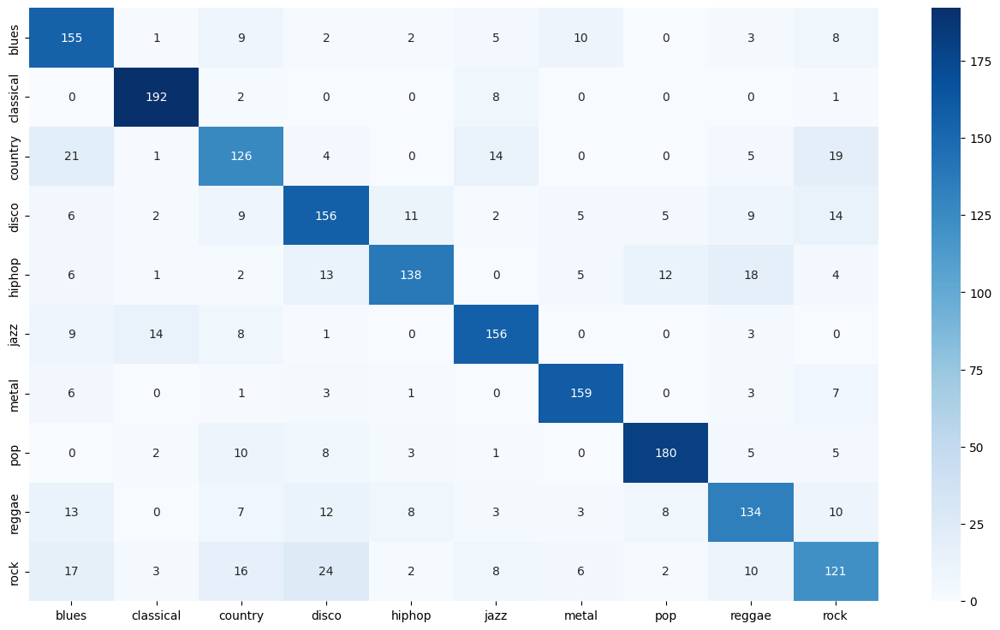

In [49]:
# Support Vector Machine

svm = SVC(decision_function_shape="ovo")
model_build(svm, split, 'Support Vector Machine')

this SVM Model has accuracy 0.75 which is not the best so we implemented a new SVM model for better accuracy

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

In [ ]:
svm_model = SVC()


params = {
    'C': [0.1, 1.0, 10.0],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'gamma': ['scale', 'auto']
}


In [ ]:

SVM_grid_search = GridSearchCV(svm_model, params, cv=5)
SVM_grid_search.fit(X_train, y_train)


print("Best Hyperparameters:", SVM_grid_search.best_params_)
print("Best Score:", SVM_grid_search.best_score_)


Best Hyperparameters: {'C': 10.0, 'gamma': 'scale', 'kernel': 'poly'}
Best Score: 0.8459706560047596


In [ ]:

test_accuracy = SVM_grid_search.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)

Test Accuracy: 0.8803042433947158


#XG Boost model

Accuracy score of XG Boost is: 0.9


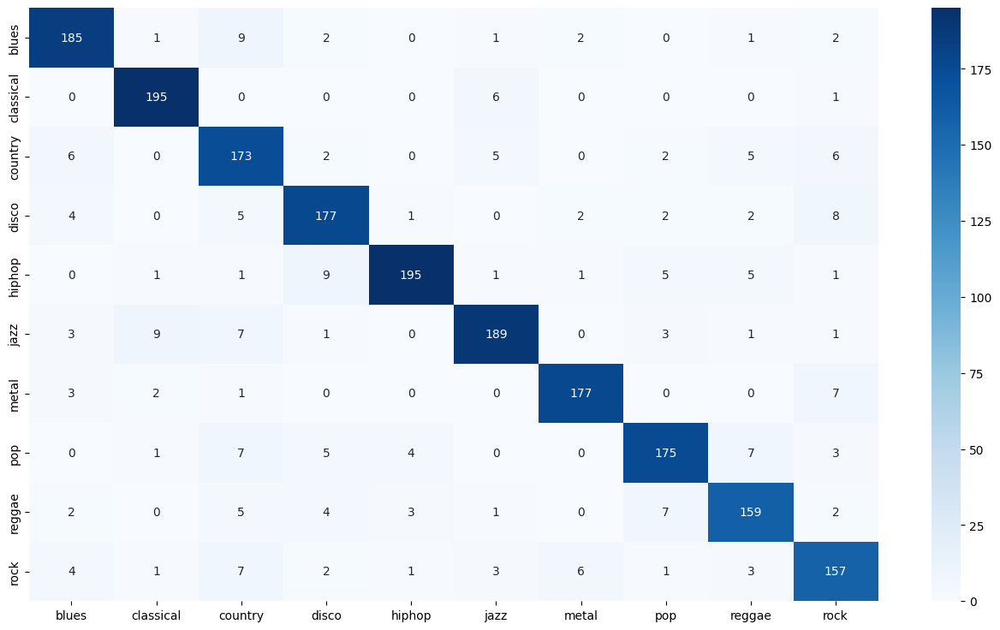

In [59]:
# XG Boost
from sklearn.preprocessing import LabelEncoder

def model_build_xgb(model, kf, title = "Default"):
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y_encoded[train_index], y_encoded[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
        y_pred_labels = label_encoder.inverse_transform(y_pred)

    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    # Let's see the confusion matrix of the last split for a little insight
    con_mat = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, cmap="Blues", annot=True, fmt="d",
                xticklabels = ["blues", "classical", "country", "disco",
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
                yticklabels=["blues", "classical", "country", "disco", "hiphop",
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()


xgb = XGBClassifier()
model_build_xgb(xgb, split, 'XG Boost')

Accuracy score of XG Boost is: 0.9

#Accuracies

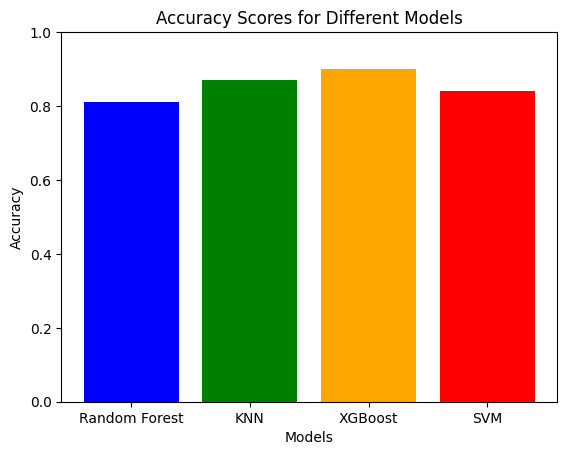

In [54]:
import matplotlib.pyplot as plt


model_names = ['Random Forest', 'KNN', 'XGBoost', 'SVM']
accuracy_scores = [0.81, 0.87, 0.90, 0.84]


plt.bar(model_names, accuracy_scores, color=['blue', 'green', 'orange', 'red'])
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy Scores for Different Models')
plt.ylim(0, 1)  
plt.show()


This shows that the XGBoost got the best accuracy and KNN the second best

>accuracy_scores = Random forest = 0.81, KNN= 0.87, XGBoost= 0.90, SVM= 0.84

#XGBoost Evaluation

In [16]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.25, random_state=1)

model = XGBClassifier(n_estimators=1000, learning_rate=0.3)
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [17]:
y_pred = model.predict(X_test)
print('Accuracy', ':', round(accuracy_score(y_test, y_pred), 5))

Accuracy : 0.91353


It got evaluation Accuracy : 0.91353

#Testing the models
>SVM

>XGBoost

>Random Forest

>KNN

In [26]:
def extract_features(file_path):
    
    y, sr = librosa.load(file_path)

    
    chroma_stft_mean = np.mean(librosa.feature.chroma_stft(y=y, sr=sr))
    chroma_stft_var = np.var(librosa.feature.chroma_stft(y=y, sr=sr))
    rms_mean = np.mean(librosa.feature.rms(y=y))
    rms_var = np.var(librosa.feature.rms(y=y))
    spectral_centroid_mean = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
    spectral_centroid_var = np.var(librosa.feature.spectral_centroid(y=y, sr=sr))
    spectral_bandwidth_mean = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    spectral_bandwidth_var = np.var(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    rolloff_mean = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))
    rolloff_var = np.var(librosa.feature.spectral_rolloff(y=y, sr=sr))
    zero_crossing_rate_mean = np.mean(librosa.feature.zero_crossing_rate(y))
    zero_crossing_rate_var = np.var(librosa.feature.zero_crossing_rate(y))

    
    y_harmonic, y_percussive = librosa.effects.hpss(y)

    harmony_mean = np.mean(y_harmonic)
    harmony_var = np.var(y_harmonic)
    perceptr_mean = np.mean(y_percussive)
    perceptr_var = np.var(y_percussive)

    tempo, _ = librosa.beat.beat_track(y=y, sr=sr)

    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
    mfcc_means = np.mean(mfccs, axis=1)
    mfcc_vars = np.var(mfccs, axis=1)

    
    features = [
        chroma_stft_mean, chroma_stft_var, rms_mean, rms_var,
        spectral_centroid_mean, spectral_centroid_var,
        spectral_bandwidth_mean, spectral_bandwidth_var,
        rolloff_mean, rolloff_var,
        zero_crossing_rate_mean, zero_crossing_rate_var,
        harmony_mean, harmony_var,
        perceptr_mean, perceptr_var,
        tempo,
    ]

    features.extend(mfcc_means)
    features.extend(mfcc_vars)

    return features


In [34]:
def predict_genre(model, file_path, label_encoder):
   
    input_features = extract_features(file_path)

    
    prediction = model.predict([input_features])[0]

    
    predicted_genre = label_encoder.inverse_transform([prediction])[0]

    return predicted_genre

#XGBoost testing

In [27]:
# Example usage
file_path = "/content/drive/MyDrive/DataSpeech/recorded_audio4.wav"  
predicted_genre = predict_genre(xgb, file_path, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: classical


In [28]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/recorded_audio5.wav"  
predicted_genre = predict_genre(xgb, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: classical


In [55]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/Jazz.wav" 
predicted_genre = predict_genre(xgb, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: classical


#SVM testing

In [46]:
# Example usage
file_path = "/content/drive/MyDrive/DataSpeech/recorded_audio4.wav"  
predicted_genre = predict_genre(SVM_grid_search, file_path, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: classical


In [47]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/recorded_audio5.wav"  
predicted_genre = predict_genre(SVM_grid_search, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: hiphop


In [56]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/Jazz.wav"  
predicted_genre = predict_genre(SVM_grid_search, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: classical


#Random Forest Classifier Testing

In [50]:
# Example usage
file_path = "/content/drive/MyDrive/DataSpeech/recorded_audio4.wav"  
predicted_genre = predict_genre(rfc, file_path, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: classical


In [51]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/recorded_audio5.wav"  
predicted_genre = predict_genre(rfc, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: jazz


In [57]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/Jazz.wav"  
predicted_genre = predict_genre(rfc, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: jazz


#KNN Testing

In [52]:
# Example usage
file_path = "/content/drive/MyDrive/DataSpeech/recorded_audio4.wav"  
predicted_genre = predict_genre(knn, file_path, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: reggae


In [53]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/recorded_audio5.wav"  
predicted_genre = predict_genre(knn, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: hiphop


In [58]:
# Example usage
file_path2 = "/content/drive/MyDrive/DataSpeech/Jazz.wav"  
predicted_genre = predict_genre(knn, file_path2, label_encoder)
print("Predicted Genre:", predicted_genre)

Predicted Genre: pop
